In [2]:
#import image from the computer

import numpy as np
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
import imageio
from findpeaks import findpeaks

from mpl_toolkits.mplot3d import Axes3D#
import pandas as pd
from sklearn.cluster import KMeans


In [3]:
def specular_removal(rgb_img,threshold, show=False):   
    diffuse_chrom_max= np.zeros((len(rgb_img),len(rgb_img[0])))
    diffuse_chrom_min= np.zeros((len(rgb_img),len(rgb_img[0])))
    I_psf= np.zeros((len(rgb_img),len(rgb_img[0]),3))
        
    # compute minimum maximum and range values for each pixel
    for i in range(0, len(rgb_img)):
        for j in range(0, len(rgb_img[0])):
            red= rgb_img[i,j,0]
            green= rgb_img[i,j,1]
            blue= rgb_img[i,j,2]
            diffuse_chrom_max[i,j]= max(red, green, blue)
            diffuse_chrom_min[i,j]= min(red, green, blue)
            #pseudo spec free image
            
            I_psf[i,j,:]= rgb_img[i,j,:] - (diffuse_chrom_min[i,j],diffuse_chrom_min[i,j],diffuse_chrom_min[i,j])

    diffuse_chrom_range = diffuse_chrom_max - diffuse_chrom_min
    intensity_ratio= diffuse_chrom_max/ (diffuse_chrom_range +1)

    total= 0
    #calculaate average min intensity

    for i in range(0, len(rgb_img)):
        for j in range(0, len(rgb_img[0])):
            total= total+ diffuse_chrom_min[i,j]
            
    I_av_min= total/ ((len(rgb_img)* len(rgb_img[0])))

    I_psf= I_psf + I_av_min

    image= np.dstack((I_psf[:,:,0],I_psf[:,:,1],I_psf[:,:,2]))
    image=  cv.convertScaleAbs(image)

    #diffuse chromaticity value
    diffuse_chrom_psf= np.zeros((len(rgb_img),len(rgb_img[0]),3))
    diffuse_chrom_psf_max= np.zeros((len(rgb_img),len(rgb_img[0])))
    diffuse_chrom_psf_min= np.zeros((len(rgb_img),len(rgb_img[0])))


    for i in range(0, len(rgb_img)):
        for j in range(0, len(rgb_img[0])):
            diffuse_chrom_psf[i,j,:]= I_psf[i,j,:] / (I_psf[i,j,0] +I_psf[i,j,1]+I_psf[i,j,2])
            red= diffuse_chrom_psf[i,j,0]
            green=diffuse_chrom_psf[i,j,1]
            blue=diffuse_chrom_psf[i,j,2]
            diffuse_chrom_psf_max[i,j]= max(red,green,blue)
            diffuse_chrom_psf_min[i,j]= min(red,green,blue)

    relevant_pixels= np.zeros((len(rgb_img),len(rgb_img[0])))

            
    for i in range(0, len(rgb_img)):
        for j in range(0, len(rgb_img[0])):
            if (diffuse_chrom_min[i,j]> I_av_min) :
                relevant_pixels[i,j] = 1

    x=[]
    y=[]
    for i in range(0, len(rgb_img)):
        for j in range(0, len(rgb_img[0])):
            if relevant_pixels[i,j] == 1:
                x.append(i)
                y.append(j)

    diffuse_chrom_psf_min_less= diffuse_chrom_psf_min[x,y]
    diffuse_chrom_psf_max_less =diffuse_chrom_psf_max[x,y]

    pseudo_chrom= np.zeros((len(diffuse_chrom_psf_min_less),2))


    for i in range(0, len(diffuse_chrom_psf_min_less)):
                pseudo_chrom[i,0]=diffuse_chrom_psf_min_less[i]
                pseudo_chrom[i,1]=diffuse_chrom_psf_max_less[i]

    # find the 3 initial centroids
    highest_minimum = float('-inf')
    coord1= (0,0)
    highest_maximum= float('-inf')
    coord2= (0,0)
    lowest_minimum= float('inf')
    coord3= (0,0)

    # Iterate through the matrix to find the highest y value
    for mini, maxi in pseudo_chrom:
        if mini > highest_minimum:
            highest_minimum = mini
            coord1= (mini,maxi)
        if mini < lowest_minimum:
            lowest_minimum= mini
            coord2= (mini,maxi)
        if maxi > highest_maximum:
            highest_maximum = maxi
            coord3= (mini,maxi)
            
    # Select random observation as centroids
    Centroids = np.array([coord1, coord2,coord3] )

    kmeans = KMeans(n_clusters=3, init=Centroids, n_init=1)

    # Fit the model to the data
    kmeans.fit(pseudo_chrom)

    # Get the final centroids and labels
    final_centroids = kmeans.cluster_centers_
    labels = kmeans.labels_

    # visualising where these pixels are in the image 
    relevant_pixels_labeled= relevant_pixels
    index= 0
    for i in range(0, len(rgb_img)):
        for j in range(0, len(rgb_img[0])):
            if (relevant_pixels[i,j] == 1):
                relevant_pixels_labeled[i,j] = (kmeans.labels_[index] +1)
                index= index+1

    # choose an intensity ratio
    intensity_ratios=[1.0,2.0,3.0]
    arr0= []
    arr1= []
    arr2= []
    for i in range(0, len(rgb_img)):
        for j in range(0, len(rgb_img[0])):
                if (relevant_pixels_labeled[i,j]== intensity_ratios[0]):
                    arr0.append(intensity_ratio[i,j])
                if (relevant_pixels_labeled[i,j]== intensity_ratios[1]):
                    arr1.append(intensity_ratio[i,j])
                if (relevant_pixels_labeled[i,j]== intensity_ratios[2]):
                    arr2.append(intensity_ratio[i,j])



    sorted_arr0 = np.sort(arr0)
    intensity_ratios[0]=sorted_arr0[int(len(sorted_arr0) * threshold)]

    sorted_arr1 = np.sort(arr1)
    intensity_ratios[1]=sorted_arr1[int(len(sorted_arr1) *threshold)]

    sorted_arr2 = np.sort(arr2)
    intensity_ratios[2]=sorted_arr2[int(len(sorted_arr2) *threshold)]     

    specular_pixels= intensity_ratio
    for i in range(0, len(rgb_img)):
        for j in range(0, len(rgb_img[0])):
                if (relevant_pixels_labeled[i,j]== 1 and intensity_ratio[i,j]>= intensity_ratios[0]):
                    specular_pixels[i,j]= intensity_ratios[0]
                if (relevant_pixels_labeled[i,j]== 2 and intensity_ratio[i,j]>= intensity_ratios[1]):
                    specular_pixels[i,j]= intensity_ratios[1]
                if (relevant_pixels_labeled[i,j]== 3 and intensity_ratio[i,j]>= intensity_ratios[2]):
                    specular_pixels[i,j]= intensity_ratios[2]

    S= diffuse_chrom_max - specular_pixels*diffuse_chrom_range
    D= np.zeros((len(rgb_img),len(rgb_img[0]),3))
    for i in range(0,3):
        D[:,:,i]= rgb_img[:,:,i]- S[:,:]


    D= np.dstack((D[:,:,0],D[:,:,1],D[:,:,2]))
    D=  cv.convertScaleAbs(D)
    
    if show==True:      
    
        plt.imshow(diffuse_chrom_max,cmap='gray')
        plt.title('diffuse_chrom_max')
        plt.colorbar()
        plt.figure()

        plt.imshow(diffuse_chrom_min,cmap='gray')
        plt.colorbar()
        plt.title('diffuse_chrom_min')
        plt.figure()


        plt.imshow(diffuse_chrom_range,cmap='gray')
        plt.title('diffuse_chrom_range')
        plt.colorbar()
        plt.figure()

        plt.imshow(intensity_ratio,cmap='gray')
        plt.title('original intensity ratio')
        plt.colorbar()
        plt.figure()

        plt.imshow(image)
        plt.title('pseudo specular free image psf')
        plt.figure()

        plt.imshow(diffuse_chrom_psf_max,cmap='gray')
        plt.title('diffuse_chrom_psf_max')
        plt.colorbar()
        plt.figure()

        plt.imshow(diffuse_chrom_psf_min,cmap='gray')
        plt.colorbar()
        plt.title('diffuse_chrom_psf_min')
        plt.figure()


        plt.imshow(relevant_pixels,cmap='gray')
        plt.colorbar()
        plt.title('relevant_pixels separated from the rest')
        plt.figure()


        plt.scatter(diffuse_chrom_psf_min_less, diffuse_chrom_psf_max_less, marker='+')
        plt.title('fpsf min and max list before clustering')
        plt.xlabel('minimum')
        plt.ylabel('max')
        plt.show()

        plt.scatter(pseudo_chrom[:,0], pseudo_chrom[:,1], marker='+',  c = kmeans.labels_)
        plt.title('fpsf min and max list after clustering')
        plt.xlabel('minimum')
        plt.ylabel('max')
        plt.show()

        plt.imshow(S ,cmap='gray')
        plt.title('specular component')
        plt.colorbar()
        plt.figure()

        plt.imshow(D)
        plt.title('diffuse component')
        plt.figure()

        plt.imshow(rgb_img)
        plt.title('Original image')
        plt.figure()

    return D, S

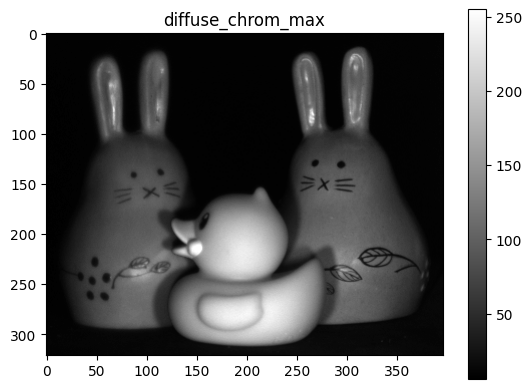

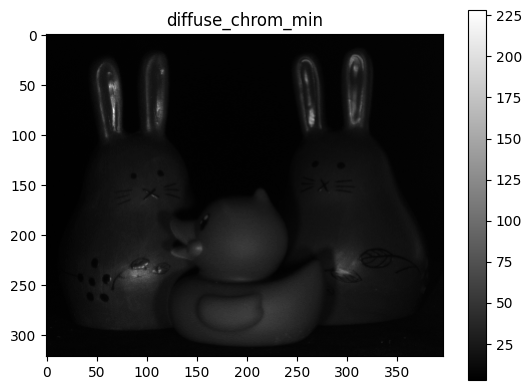

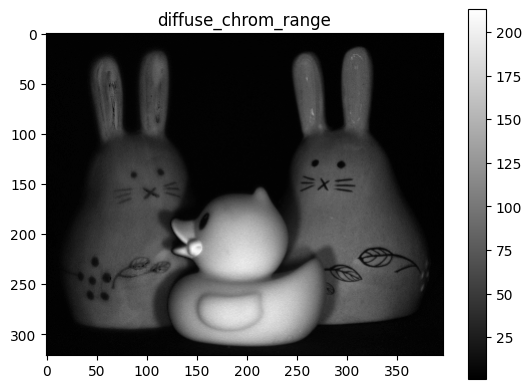

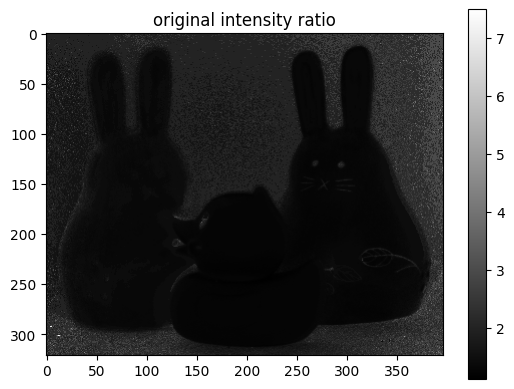

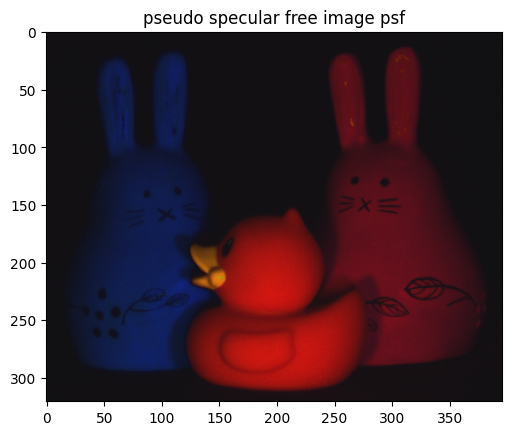

...

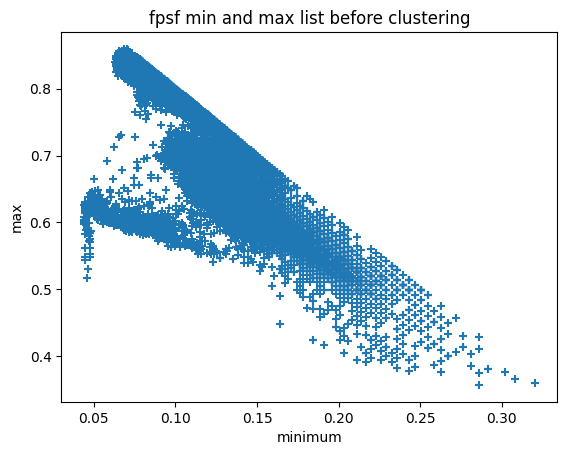

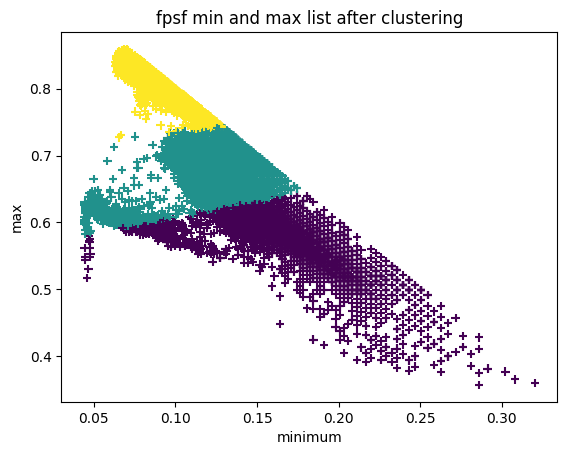

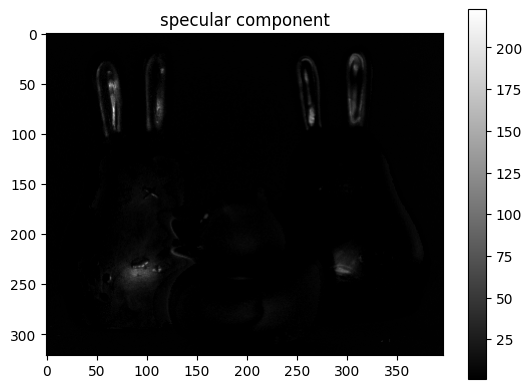

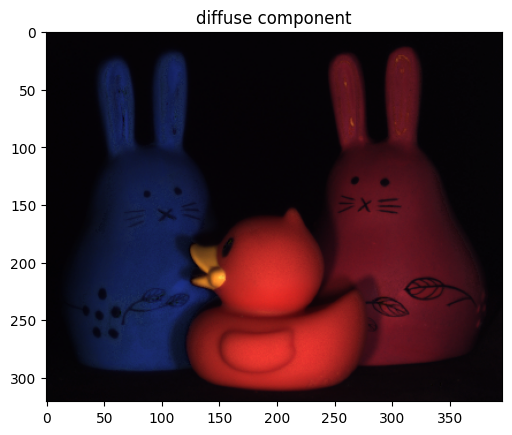

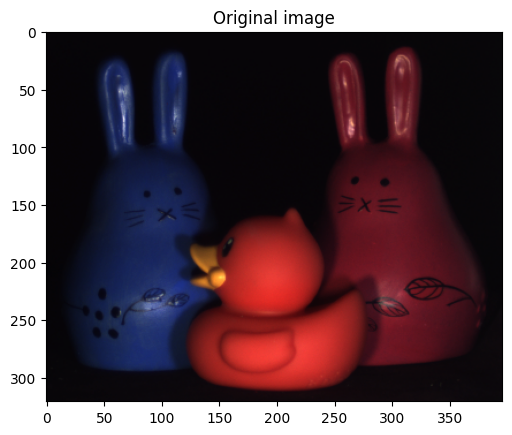

<Figure size 640x480 with 0 Axes>

In [3]:
#rgb_img = imageio.imread("C:/Users/Ana Stojanovic/OneDrive/Desktop/IIB project/photos/coloured_cubes_sample.jpg")
rgb_img = imageio.imread("C:/Users/Ana Stojanovic/OneDrive/Desktop/example_spec_removal.bmp")

D, S= specular_removal(rgb_img,0.5,show= True)




(577, 433, 3)


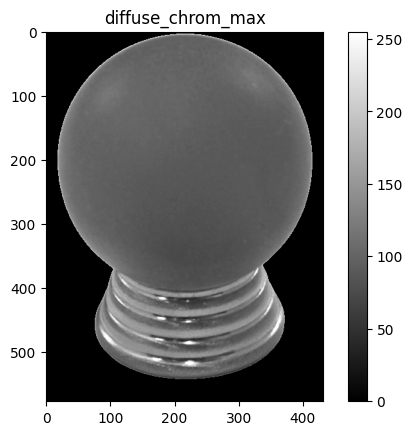

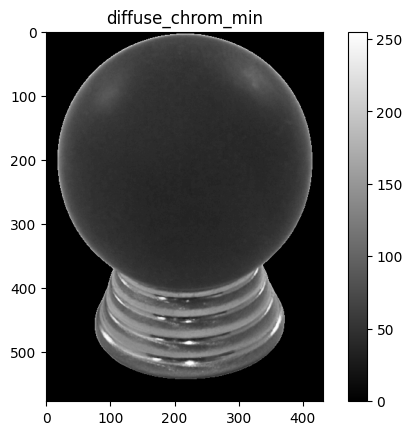

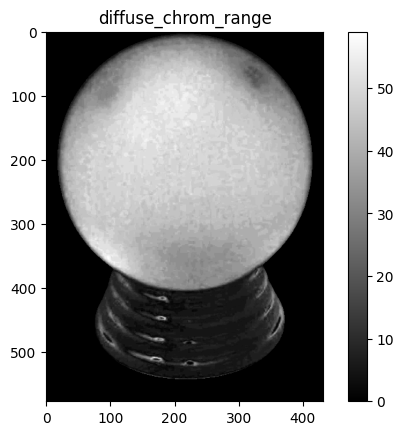

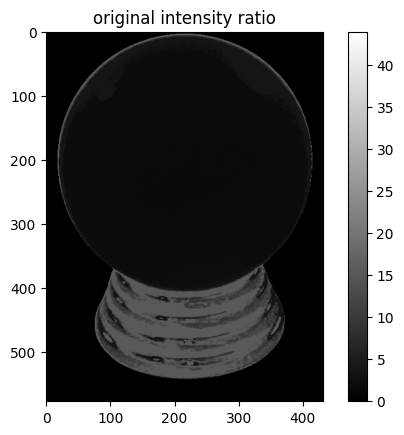

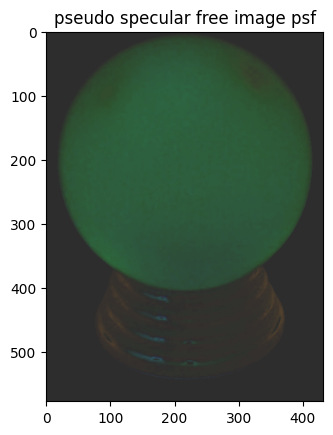

...

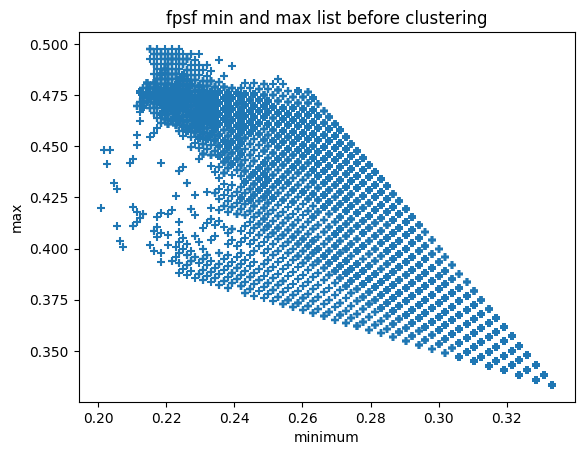

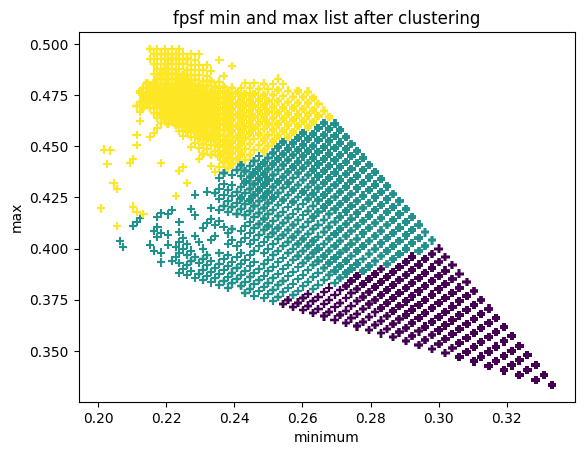

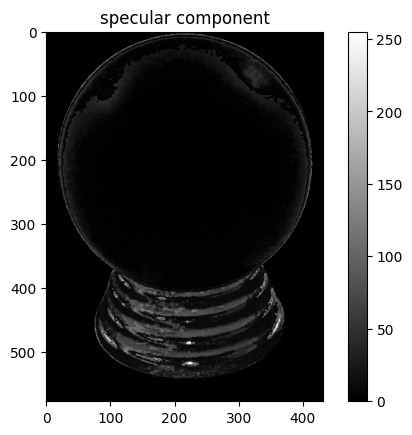

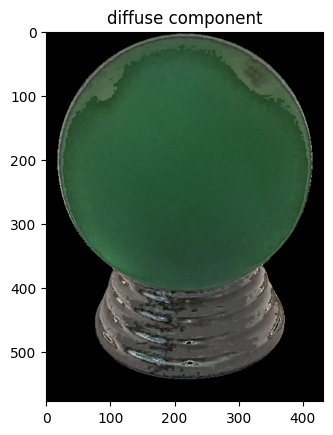

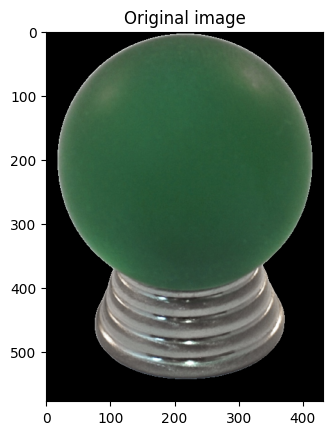

<Figure size 640x480 with 0 Axes>

In [24]:
rgb_img = imageio.imread("C:/Users/Ana Stojanovic/OneDrive/Desktop/IIB project/photos/materials_sample-removebg-preview.png")
rgb_img= rgb_img[:,:,0:3] #remove alpha channel
print(rgb_img.shape)
D, S= specular_removal(rgb_img,show= True)



(667, 1000, 3)


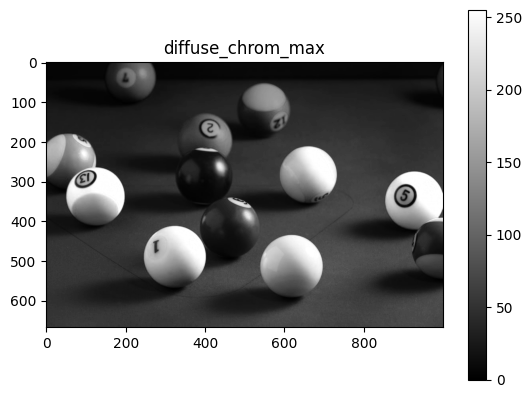

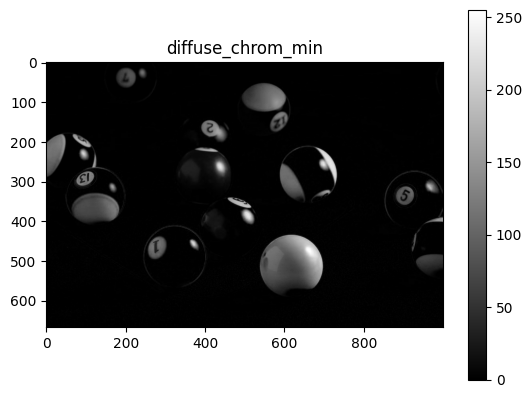

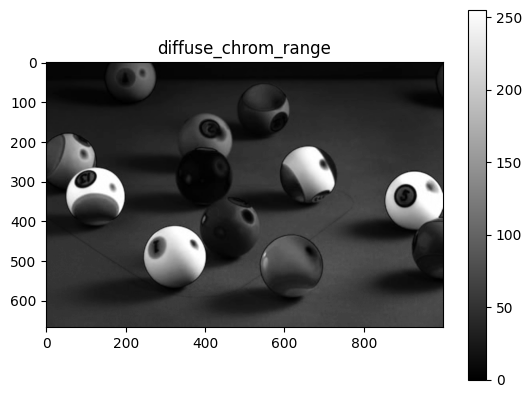

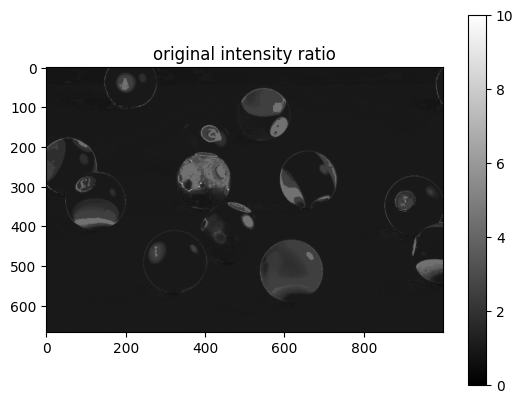

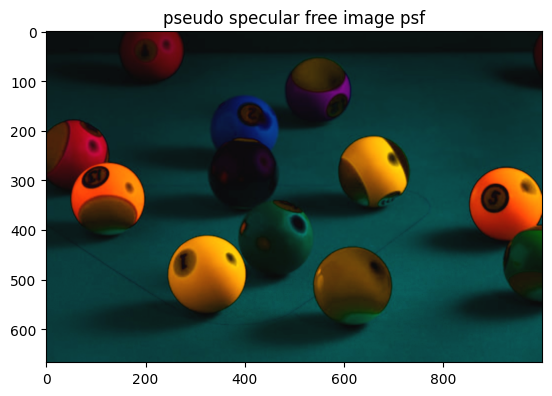

...

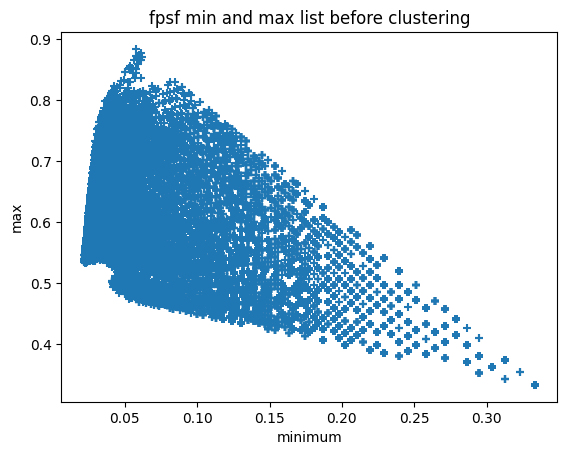

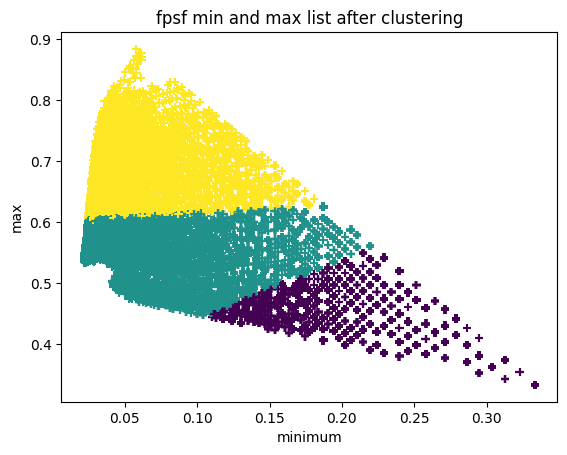

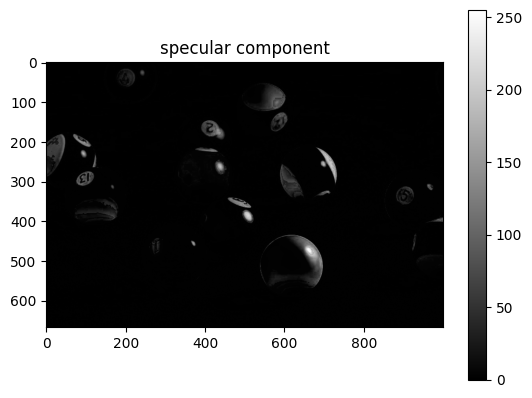

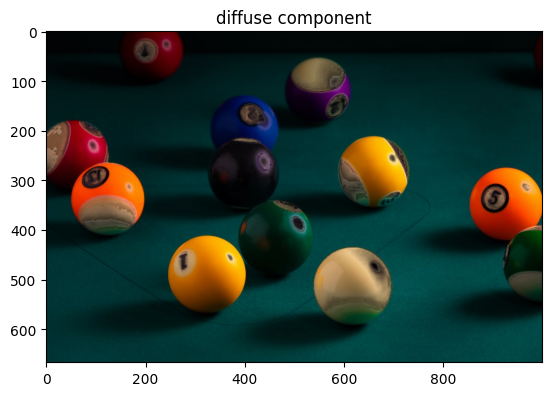

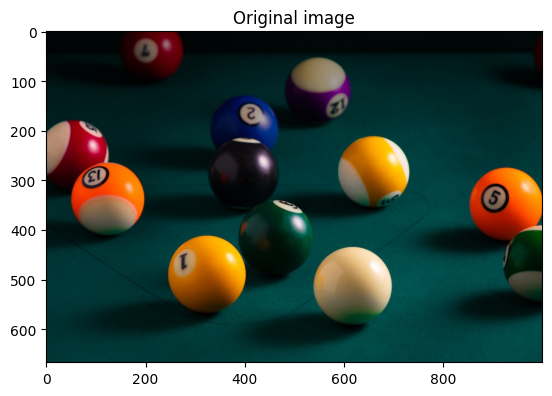

<Figure size 640x480 with 0 Axes>

In [26]:
rgb_img = imageio.imread("C:/Users/Ana Stojanovic/OneDrive/Desktop/IIB project/photos/billiard_balls_sample.jpg")
rgb_img= rgb_img[:,:,0:3] #remove alpha channel
D, S= specular_removal(rgb_img,show= True)



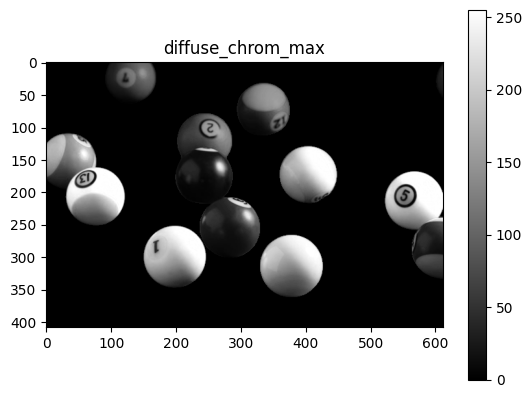

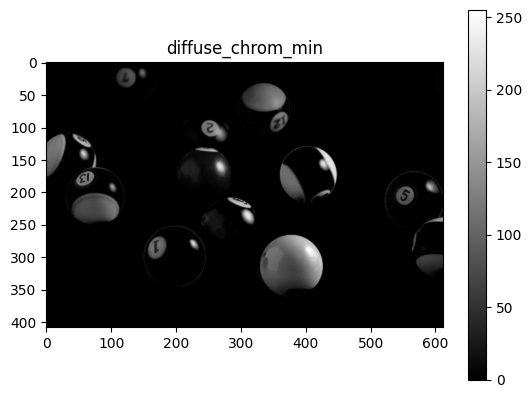

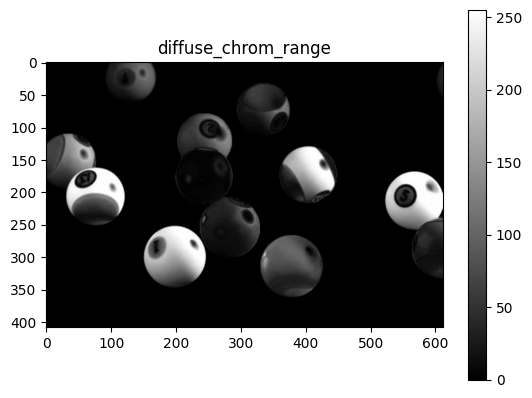

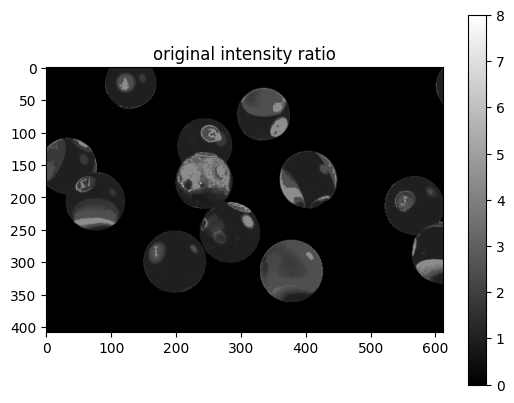

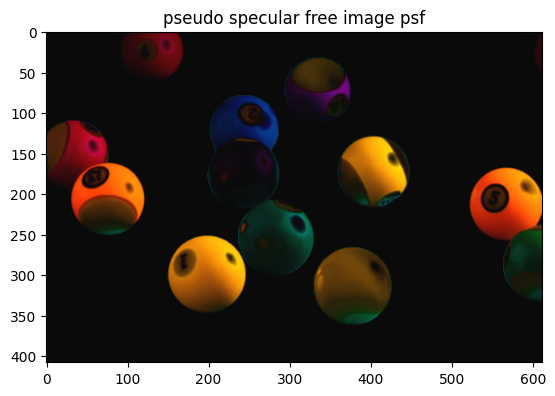

...

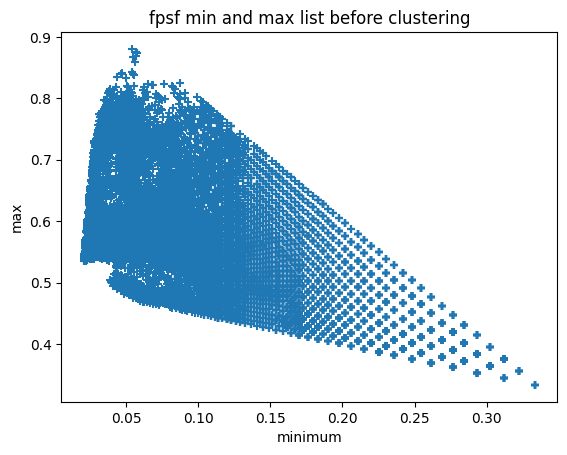

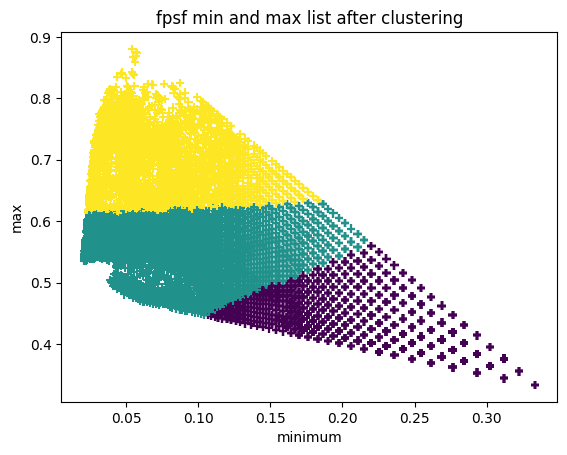

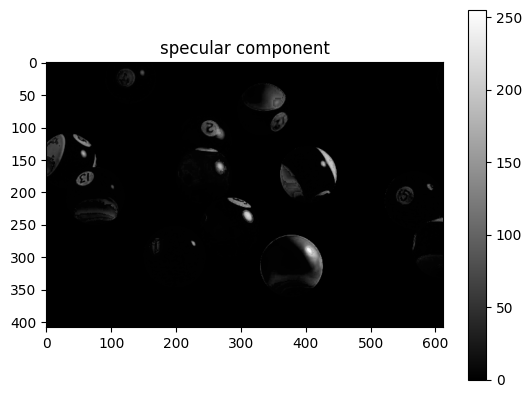

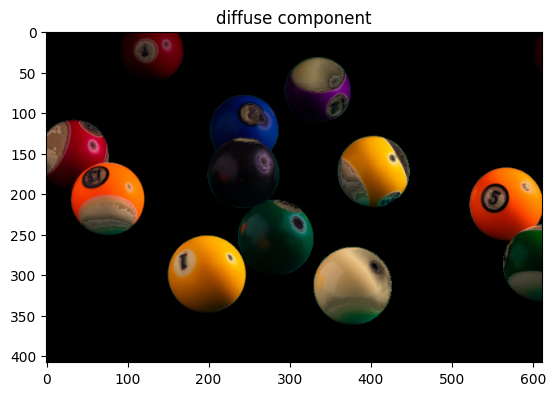

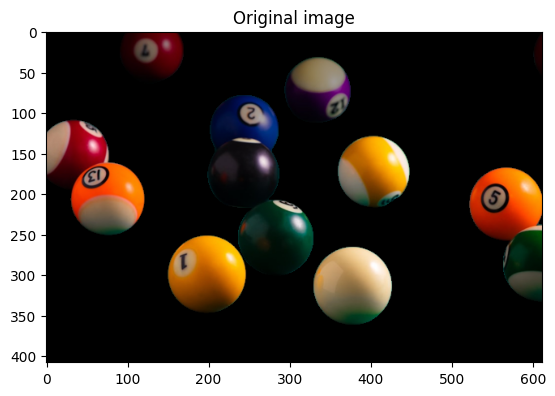

<Figure size 640x480 with 0 Axes>

In [28]:
rgb_img = imageio.imread("C:/Users/Ana Stojanovic/OneDrive/Desktop/IIB project/photos/billiard_balls_sample-removebg-preview.png")
rgb_img= rgb_img[:,:,0:3] #remove alpha channel
D, S= specular_removal(rgb_img,show= True)

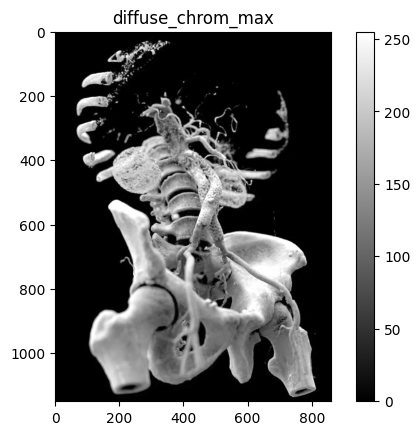

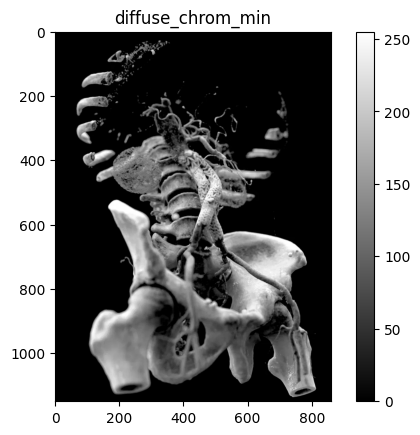

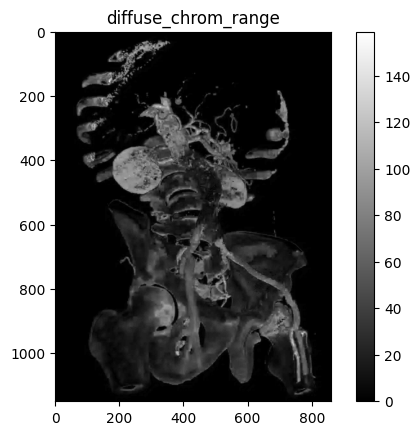

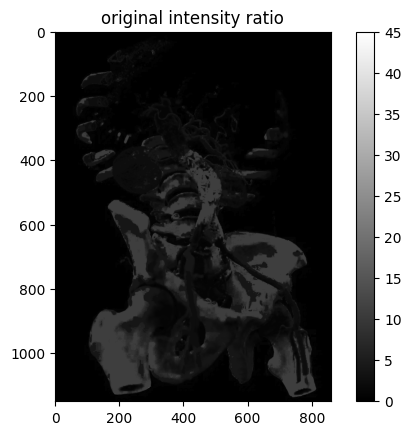

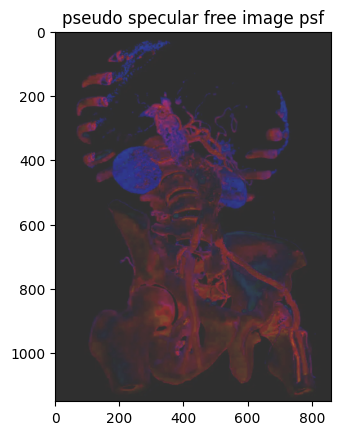

...

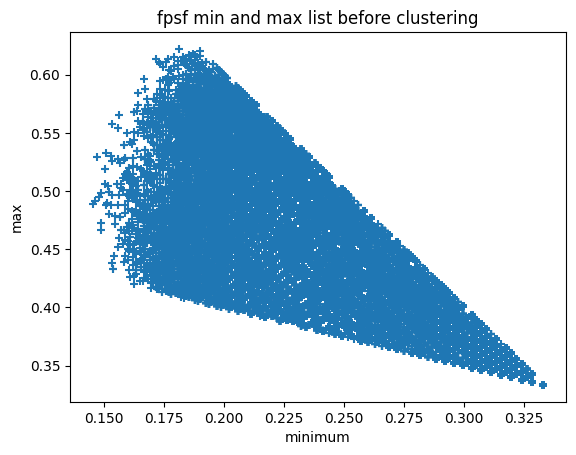

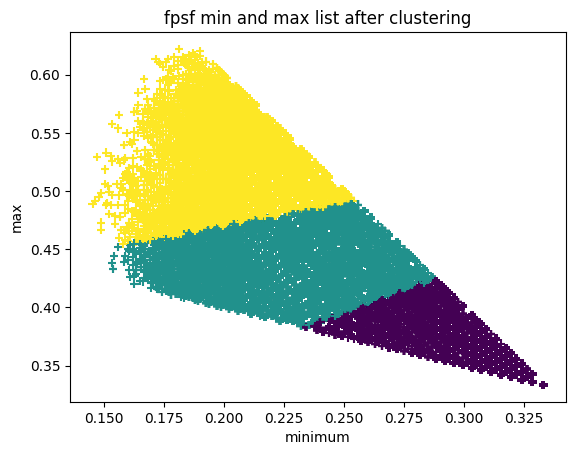

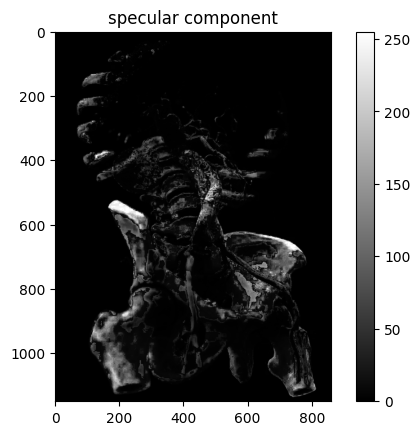

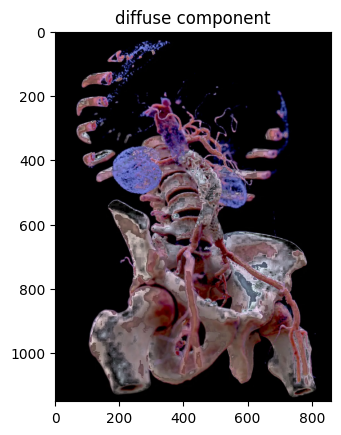

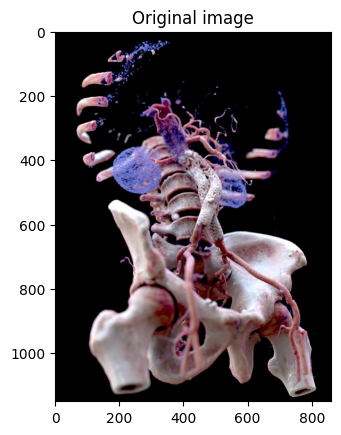

<Figure size 640x480 with 0 Axes>

In [30]:
rgb_img = imageio.imread("C:/Users/Ana Stojanovic/OneDrive/Desktop/IIB project/photos/pretty_image.png")
rgb_img= rgb_img[:,:,0:3] #remove alpha channel
D, S= specular_removal(rgb_img,show= True)

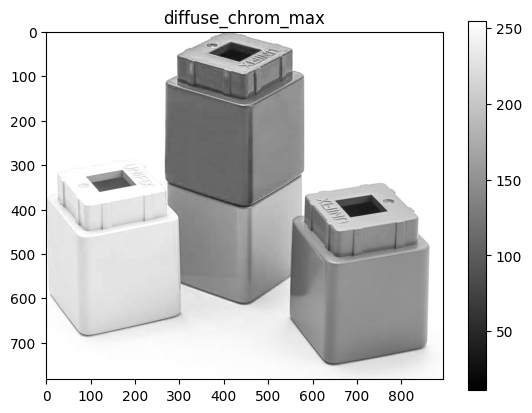

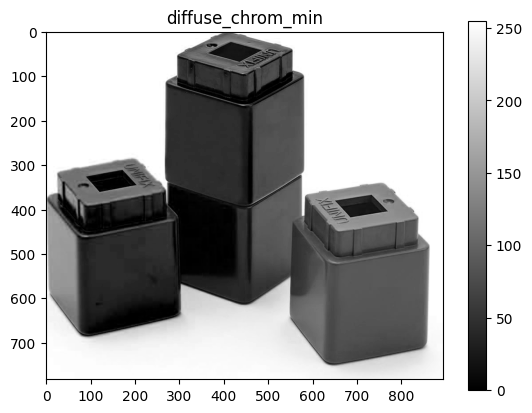

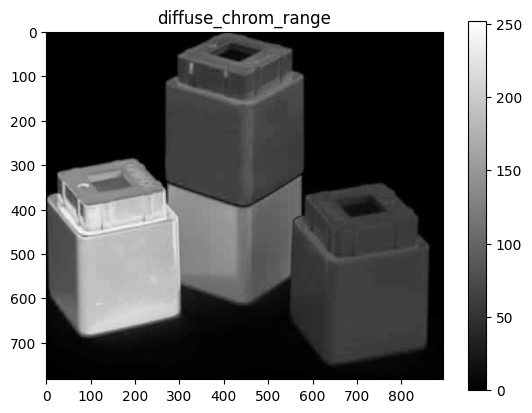

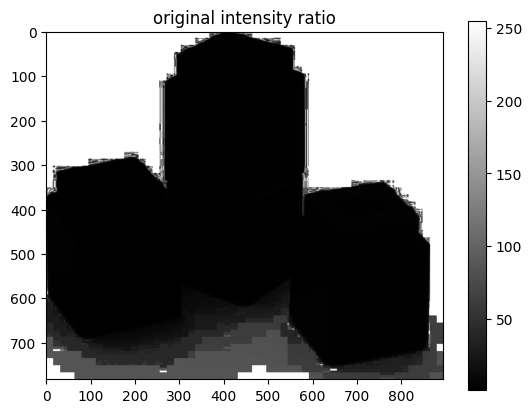

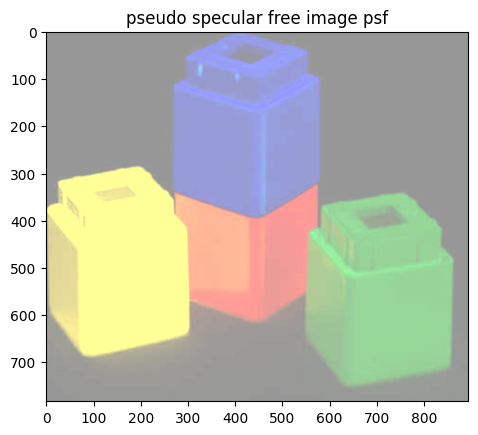

...

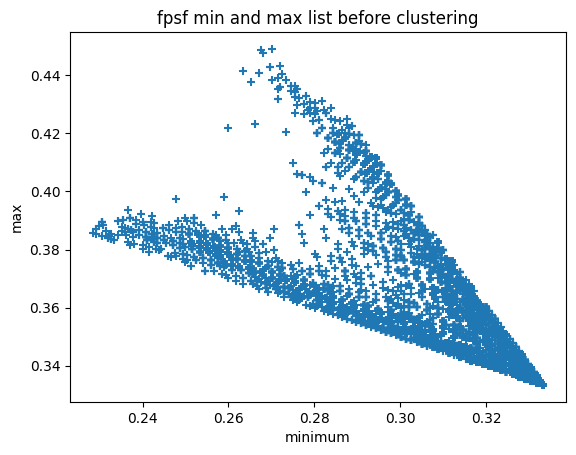

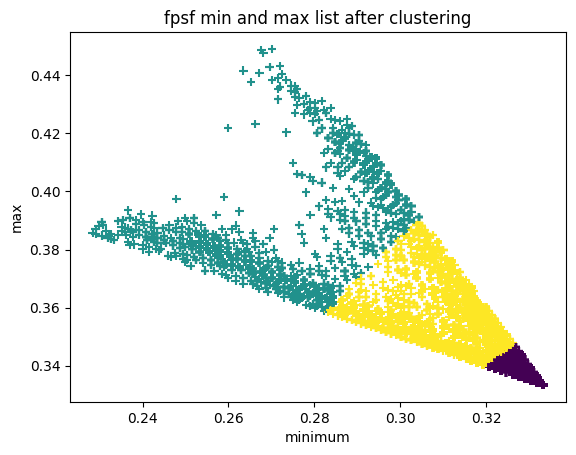

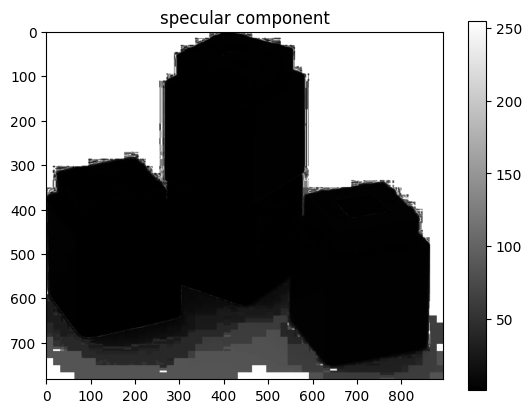

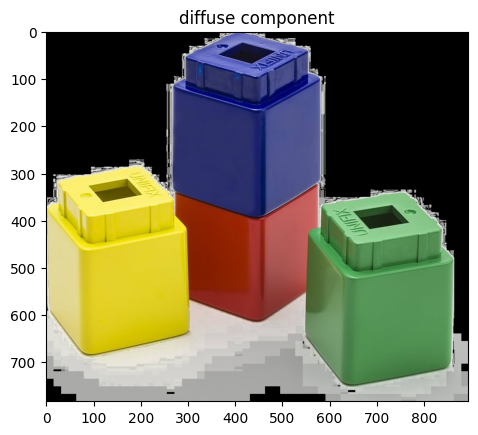

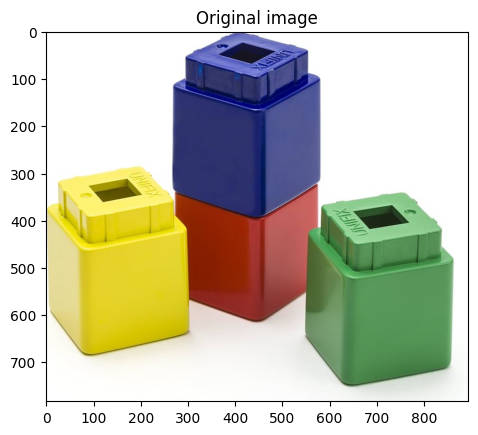

<Figure size 640x480 with 0 Axes>

In [33]:
rgb_img = imageio.imread("C:/Users/Ana Stojanovic/OneDrive/Desktop/IIB project/photos/coloured_cubes_sample.jpg")

D, S= specular_removal(rgb_img,0.9,show= True)

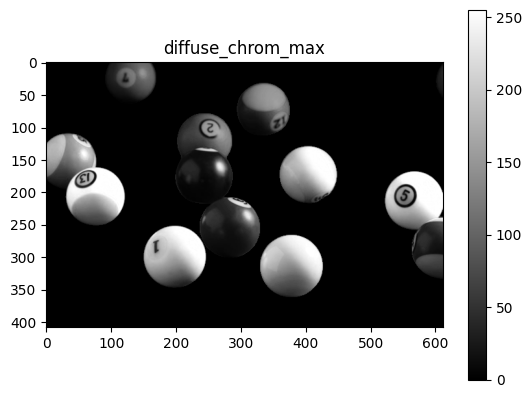

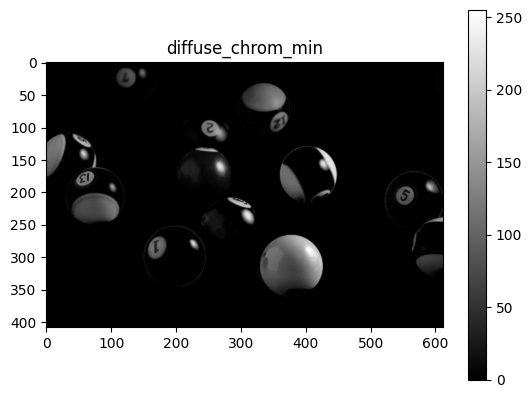

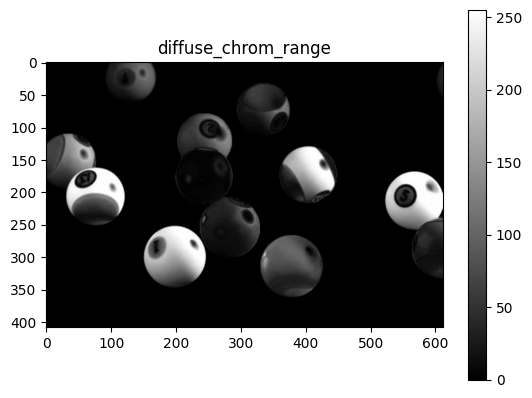

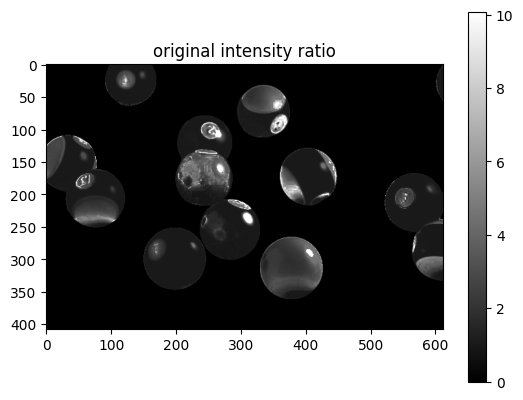

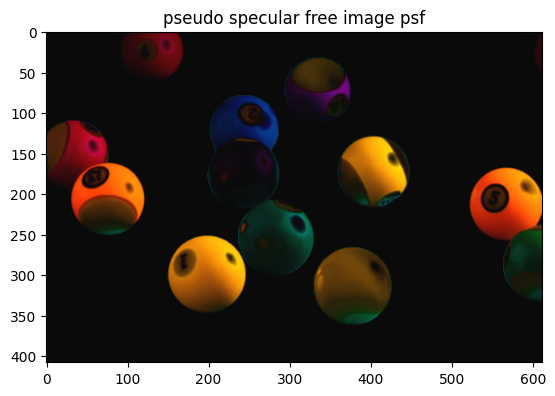

...

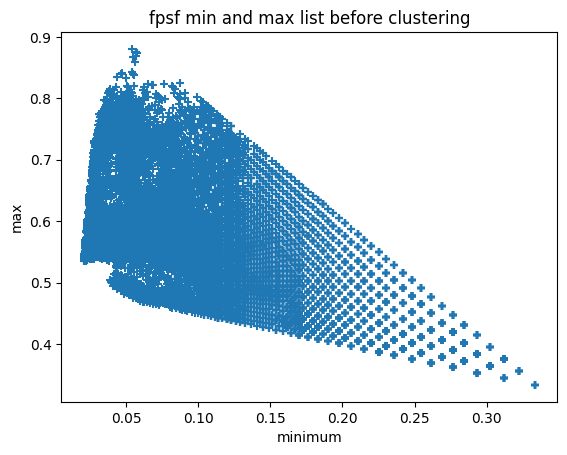

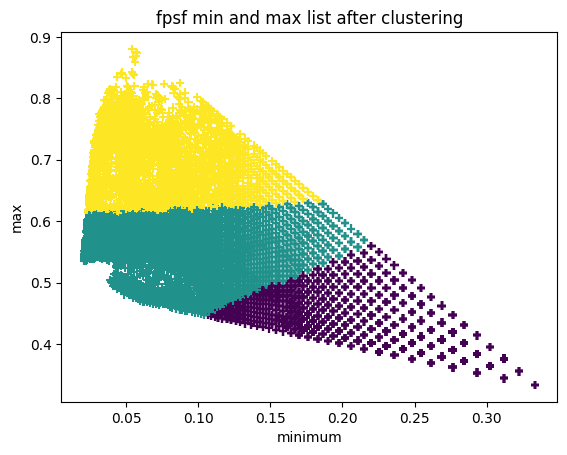

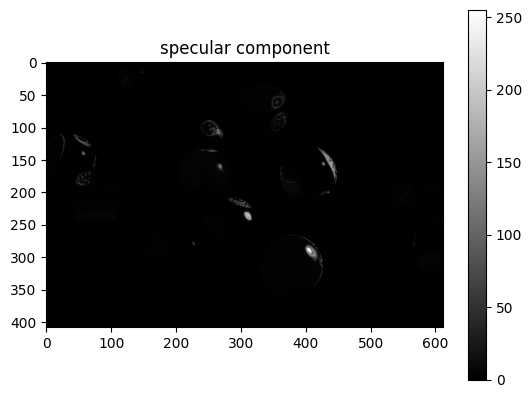

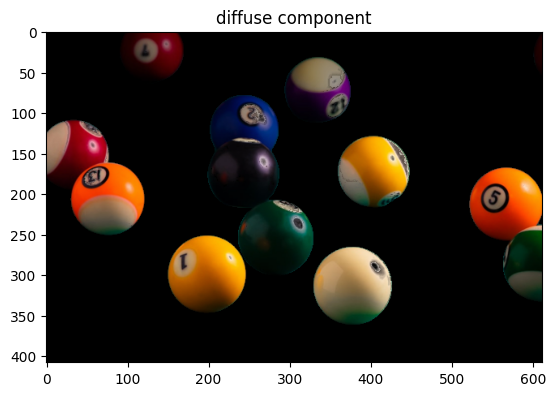

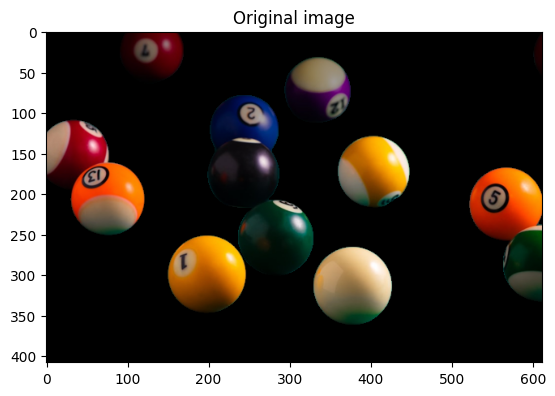

<Figure size 640x480 with 0 Axes>

In [34]:
rgb_img = imageio.imread("C:/Users/Ana Stojanovic/OneDrive/Desktop/IIB project/photos/billiard_balls_sample-removebg-preview.png")
rgb_img= rgb_img[:,:,0:3] #remove alpha channel
D, S= specular_removal(rgb_img,0.9,show= True)

In [36]:
rgb_img = imageio.imread("C:/Users/Ana Stojanovic/OneDrive/Desktop/IIB project/photos/pretty_image.png")
rgb_img= rgb_img[:,:,0:3] #remove alpha channel
D, S= specular_removal(rgb_img,0.9,show= 0)

<Figure size 640x480 with 0 Axes>

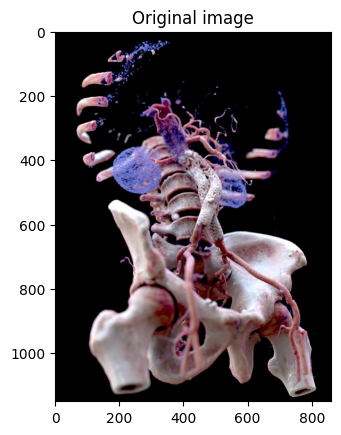

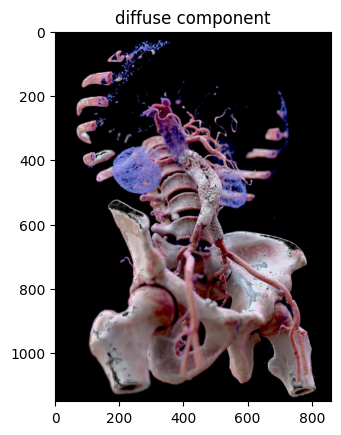

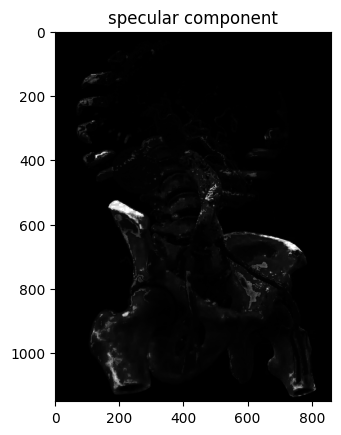

<Figure size 640x480 with 0 Axes>

In [38]:
plt.imshow(rgb_img)
plt.title('Original image')
plt.figure()

plt.imshow(D)
plt.title('diffuse component')
plt.figure()

plt.imshow(S ,cmap='gray')
plt.title('specular component')
plt.figure()


<Figure size 640x480 with 0 Axes>

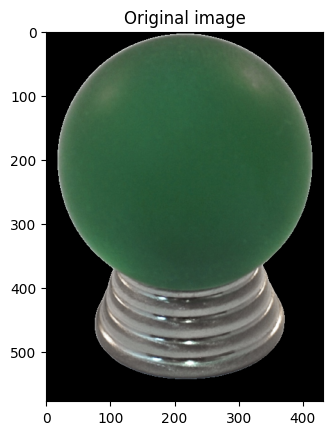

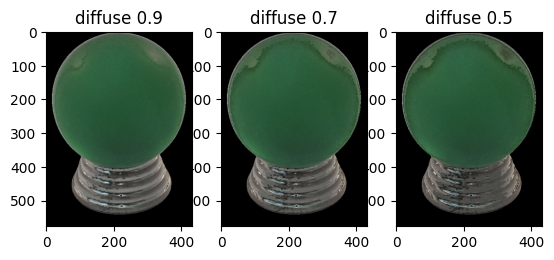

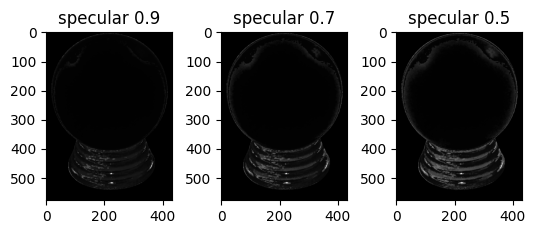

<Figure size 640x480 with 0 Axes>

In [42]:
rgb_img = imageio.imread("C:/Users/Ana Stojanovic/OneDrive/Desktop/IIB project/photos/materials_sample-removebg-preview.png")
rgb_img= rgb_img[:,:,0:3] #remove alpha channel
D, S= specular_removal(rgb_img,0.9,show= 0)
d2,s2= specular_removal(rgb_img,0.7,show= 0)
d3,s3= specular_removal(rgb_img,0.5,show= 0)

plt.imshow(rgb_img)
plt.title('Original image')
plt.figure()

plt.subplot(1,3,1)
plt.imshow(D)
plt.title('diffuse 0.9')

plt.subplot(1,3,2)
plt.imshow(d2)
plt.title('diffuse 0.7')

plt.subplot(1,3,3)
plt.imshow(d3)
plt.title('diffuse 0.5')
plt.figure()


plt.subplot(2,3,1)
plt.imshow(S ,cmap='gray')
plt.title('specular 0.9')

plt.subplot(2,3,2)
plt.imshow(s2 ,cmap='gray')
plt.title('specular 0.7')

plt.subplot(2,3,3)
plt.imshow(s3 ,cmap='gray')
plt.title('specular 0.5')
plt.figure()


In [10]:
rgb_img = imageio.imread("photos/coloured_cubes_sample-removebg-preview.png")
rgb_img= rgb_img[:,:,0:3] #remove alpha channel
D, S= specular_removal(rgb_img,0.7,show= 0)

plt.imshow(D)
plt.figure()
plt.imshow(S, cmap='gray')

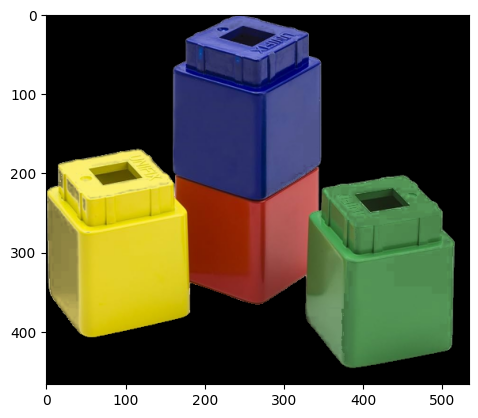

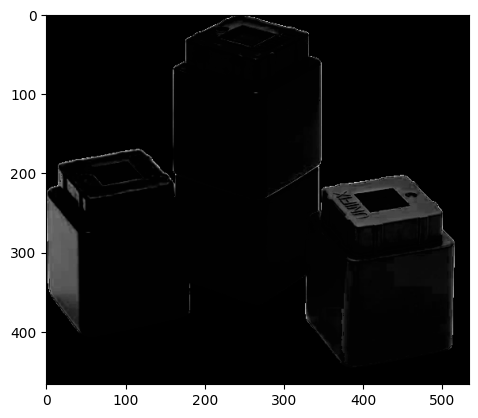

In [11]:
plt.imshow(D)
plt.figure()
plt.imshow(S, cmap='gray')